In [1]:
# Enable hot reloading 
%load_ext autoreload
%autoreload 2


In [2]:
# Set cuda device for this notebook 
import torch 
torch.cuda.set_device(2)

In [3]:
from cam import generate_cam_image
import timm 
from utils import get_imagenet_transform, seed_everything, get_imagenet_dataloader, load_images_as_tensor, get_class_map
from PIL import Image
from model import get_model
from converter import PredictionConverter
import cv2

/home/hengl/miniforge3/envs/deit/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
seed_everything(42)

# Get class map
folder_map, zip_map = get_class_map()

# Init a PredictionConverter 
converter = PredictionConverter(folder_map, zip_map)

# Create a class_map for zip_train 
class_map = converter.batch_convert(list(range(1000)), reverse=True)
print(f"class_map: {class_map}")
# Get model 
checkpoint_path = "/home/hengl/lbsm/vis/best_checkpoint_no_ls_no_cache.pth"
zip_train = [False, False]
pretrained_model, our_model = get_model('deit_small_patch16_224', checkpoint_path, qkv_bias=False, zip_train=zip_train, class_map=[None, None])




class_map: [538, 735, 432, 61, 458, 233, 188, 549, 354, 625, 864, 388, 254, 387, 216, 221, 190, 356, 168, 749, 917, 59, 201, 253, 687, 797, 750, 162, 250, 940, 313, 22, 501, 589, 585, 528, 132, 629, 315, 17, 835, 886, 725, 67, 701, 125, 531, 220, 678, 729, 852, 178, 812, 920, 333, 446, 682, 784, 431, 219, 223, 895, 425, 825, 176, 1, 728, 106, 804, 699, 428, 4, 353, 323, 68, 995, 39, 492, 570, 901, 456, 329, 319, 891, 124, 422, 69, 801, 118, 724, 859, 748, 692, 208, 900, 299, 898, 383, 415, 505, 640, 2, 101, 177, 366, 903, 524, 540, 823, 361, 965, 595, 232, 741, 112, 307, 828, 481, 127, 157, 863, 753, 854, 138, 800, 537, 557, 379, 50, 577, 763, 877, 416, 60, 787, 483, 850, 511, 350, 185, 207, 686, 468, 141, 260, 966, 990, 283, 588, 6, 96, 91, 974, 882, 48, 764, 459, 869, 637, 671, 495, 981, 924, 727, 946, 685, 809, 166, 609, 100, 902, 267, 987, 391, 152, 513, 268, 355, 81, 747, 36, 696, 672, 180, 121, 332, 234, 386, 54, 466, 46, 129, 929, 584, 810, 49, 867, 243, 847, 344, 964, 786, 369,

/home/hengl/lbsm/vis/model.py:39: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


In [34]:
# random a imagenet image
#image_paths = ["/home/hengl/lbsm/vis/ILSVRC2012_val_00001274.jpg"]
image_paths = ["/home/hengl/lbsm/vis/selected_image_cam/imagenet_shark_wrong_single.jpg"]
rgb_img = Image.open(image_paths[0]).convert("RGB")
# target_class = folder_map['n01531178']
# our_target_class = zip_map['n01531178']
target_class = folder_map['n01518878']
our_target_class = zip_map['n01518878']


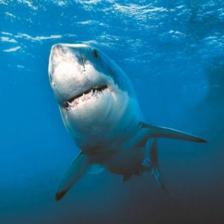

In [35]:
rgb_img

In [36]:
# rgb should be resize to 224 * 224 
rgb_img = rgb_img.resize((224, 224))
# save to org_img
rgb_img.save("org_img.jpg")


In [37]:
cam_pretrain = generate_cam_image(pretrained_model, method='gradcam', image_path=image_paths[0], target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)

In [38]:
cv2.imwrite("cam_pretrain.jpg", cam_pretrain)

True

In [39]:
cam_ours = generate_cam_image(our_model, method='gradcam', image_path=image_paths[0], target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
cv2.imwrite("cam_ours.jpg", cam_ours)


True

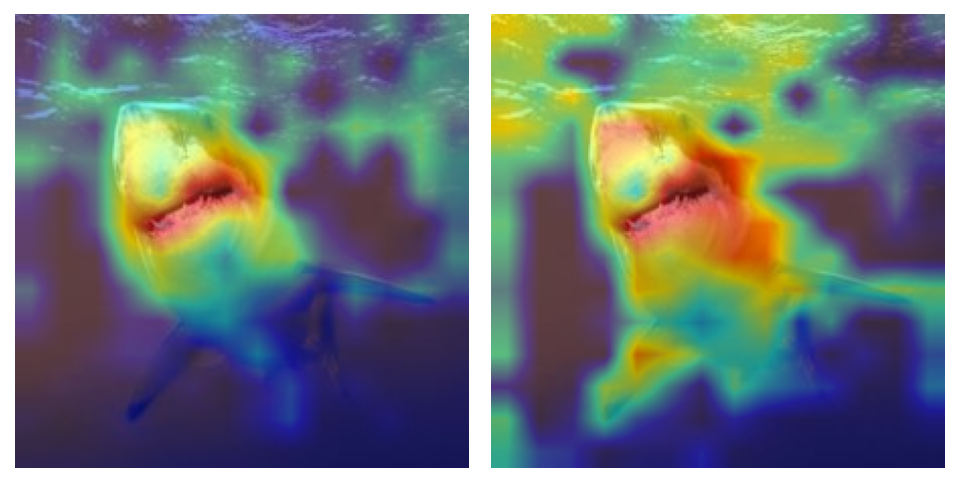

In [40]:
from cam import show_cam_comparison
show_cam_comparison(cam_pretrain, cam_ours, image_paths[0])

- Hard 8 不错 多主题
- Hard 9 不错 多主题
- Hard 13 不错 单主体
- Hard 14 不错 多主题
- /datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n03594734/ILSVRC2012_val_00000110.JPEG Jeans 多主体
- /datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n02089867/ILSVRC2012_val_00011792.JPEG
- 总是在多主体表现更好, 但是相同主体好像会差一点

In [ ]:
#for all image in vis_dir
import os 
save_dir = "/home/hengl/lbsm/vis/results/cam"
vis_dir = "/home/hengl/lbsm/vis/images_for_cam"
for image_path in os.listdir(vis_dir):
    cam_pretrain = generate_cam_image(pretrained_model, method='gradcam', image_path=os.path.join(vis_dir, image_path), target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
    cam_ours = generate_cam_image(our_model, method='gradcam', image_path=os.path.join(vis_dir, image_path), target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
    print(os.path.join(vis_dir, image_path))
    show_cam_comparison(cam_ours, cam_pretrain, os.path.join(vis_dir, image_path))


# 多主体

/home/hengl/lbsm/vis/cam.py:140: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


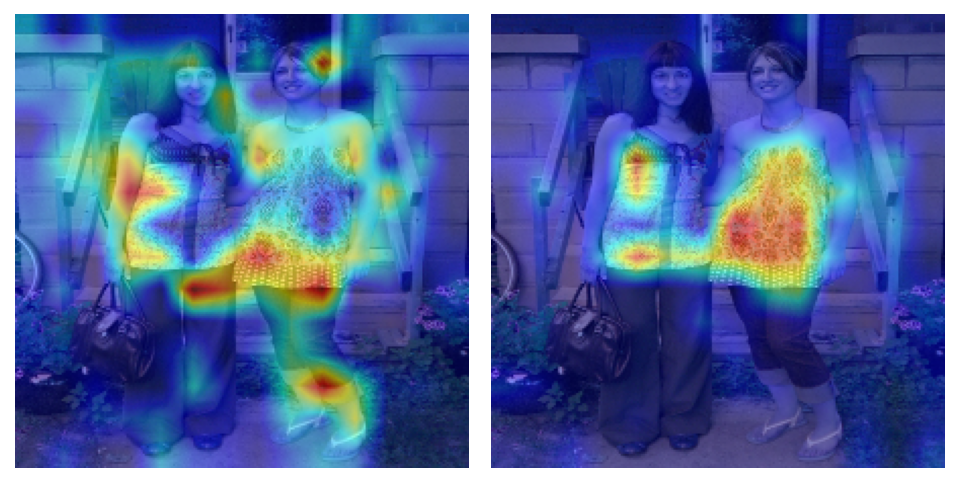

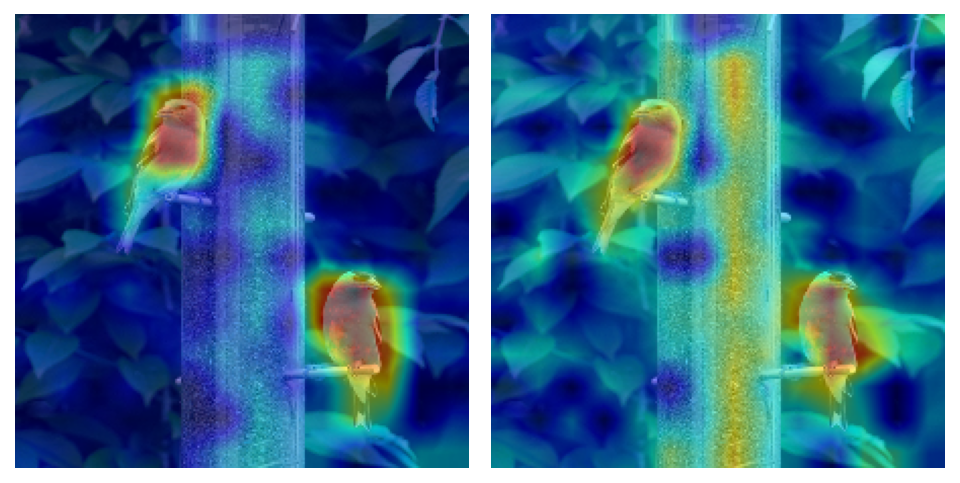

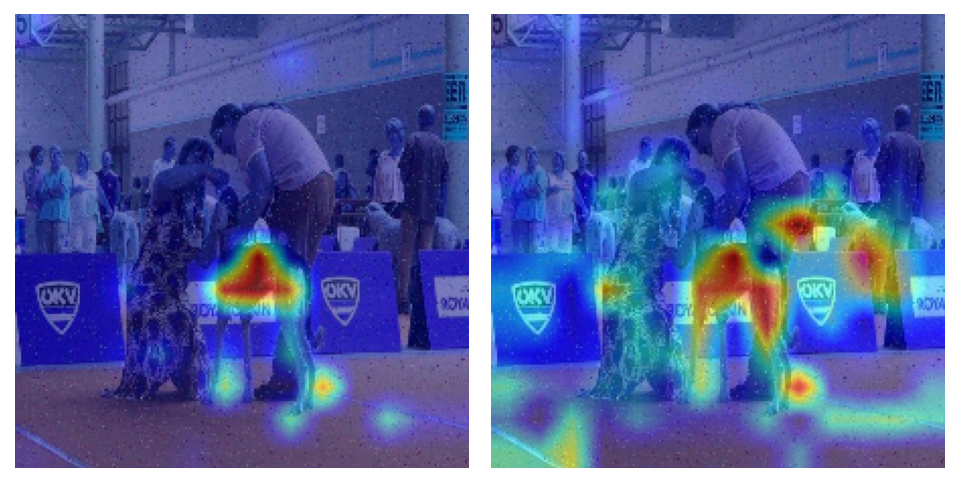

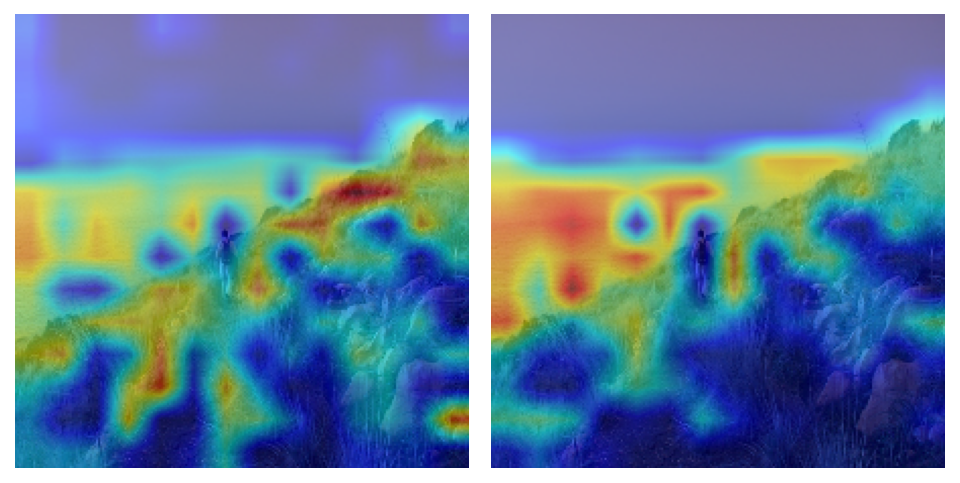

In [266]:
# Loop all images in vis 
import os 
save_dir = "/home/hengl/lbsm/vis/results/cam"
vis_dir = "/home/hengl/lbsm/vis/images_for_cam"
file_paths = ["/datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n03594734/ILSVRC2012_val_00000110.JPEG",
              "/home/hengl/lbsm/vis/images_for_cam/ILSVRC2012_val_00001274.jpg", os.path.join(vis_dir, "hard_8.jpg"), "/datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n09246464/ILSVRC2012_val_00042182.JPEG"]
for image_path in file_paths:
    cam_pretrain = generate_cam_image(pretrained_model, method='gradcam', image_path=image_path, target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
    cv2.imwrite(os.path.join(save_dir, f"cam_pretrain.jpg"), cam_pretrain)
    cam_ours = generate_cam_image(our_model, method='gradcam', image_path=image_path, target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
    cv2.imwrite(os.path.join(save_dir, f"cam_ours.jpg"), cam_ours)
    show_cam_comparison(cam_ours, cam_pretrain, image_path)
            
            

# 单主体

/home/hengl/lbsm/vis/cam.py:140: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


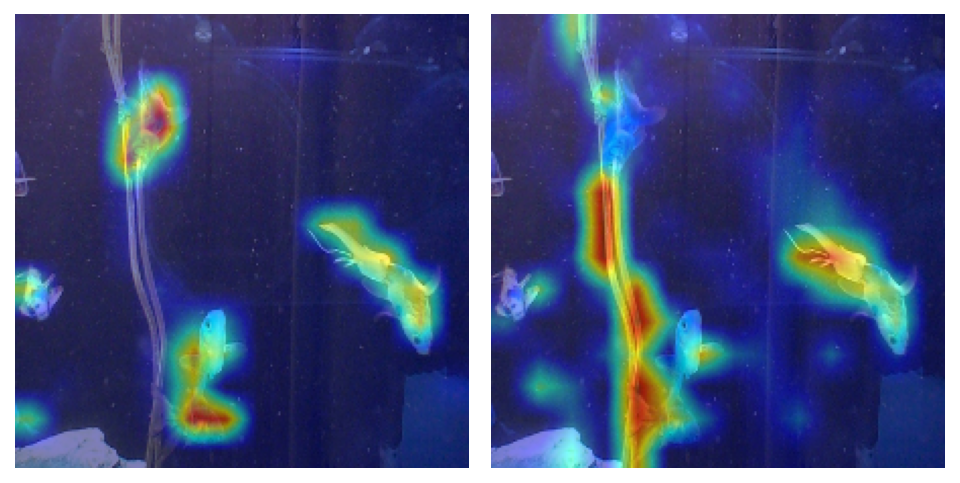

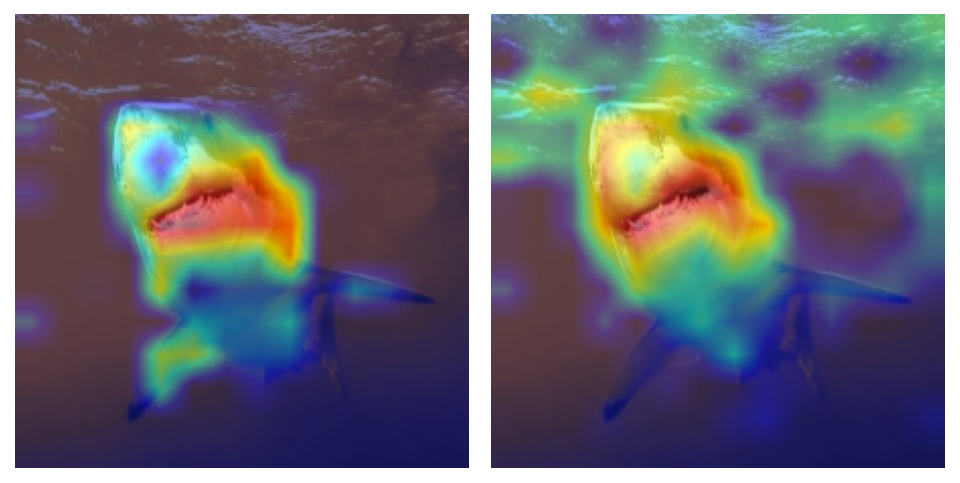

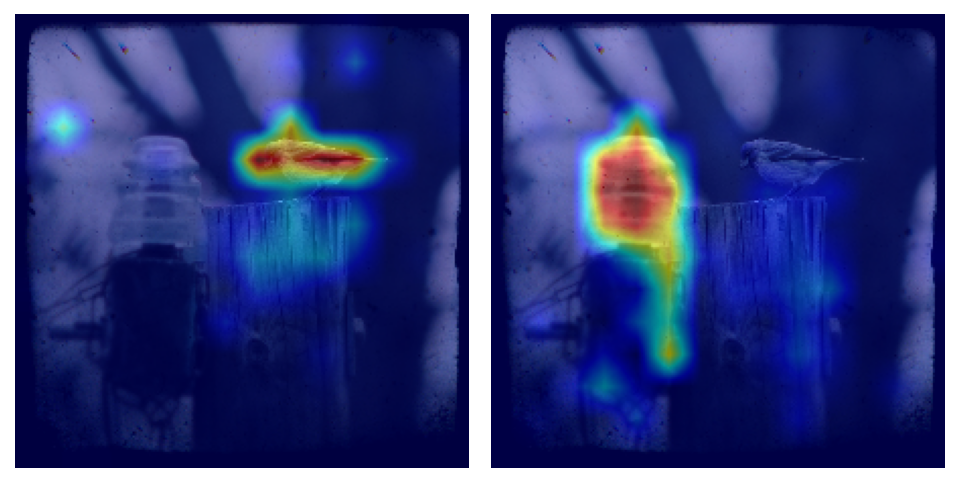

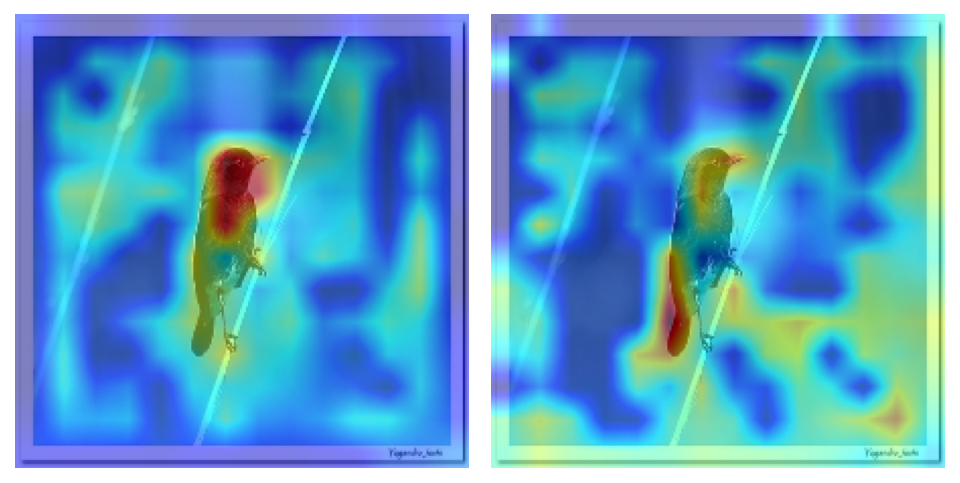

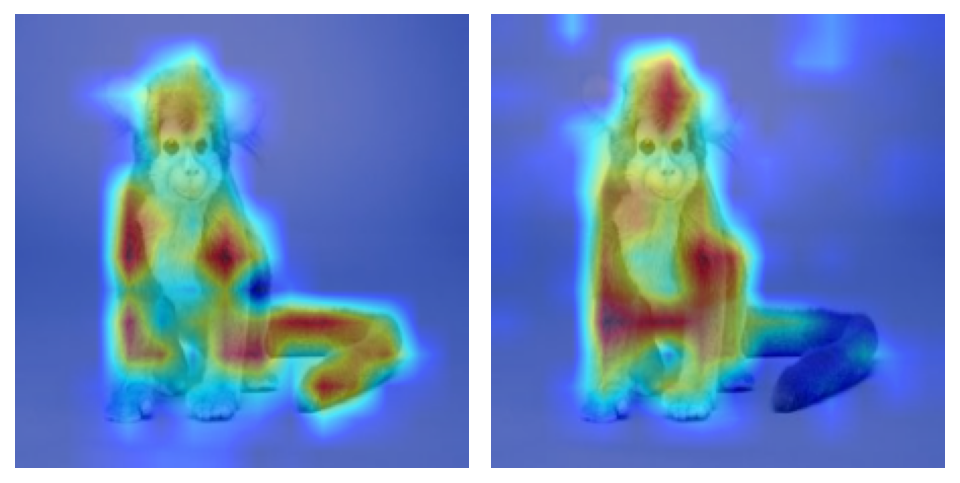

In [184]:
# Loop all images in vis 
import os 
save_dir = "/home/hengl/lbsm/vis/results/cam"
vis_dir = "/home/hengl/lbsm/vis/images_for_cam"
file_paths = ["/datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n01443537/ILSVRC2012_val_00049712.JPEG",
              "/datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n01484850/ILSVRC2012_val_00016859.JPEG",
              "/datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n01532829/ILSVRC2012_val_00013456.JPEG",
              "/datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n01582220/ILSVRC2012_val_00041051.JPEG",
              os.path.join(vis_dir, "hard_13.jpg")]
for image_path in file_paths:
    cam_pretrain = generate_cam_image(pretrained_model, method='gradcam', image_path=image_path, target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
    cv2.imwrite(os.path.join(save_dir, f"cam_pretrain.jpg"), cam_pretrain)
    cam_ours = generate_cam_image(our_model, method='gradcam', image_path=image_path, target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
    cv2.imwrite(os.path.join(save_dir, f"cam_ours.jpg"), cam_ours)
    show_cam_comparison(cam_ours, cam_pretrain, image_path)
            

In [6]:
from converter import PredictionConverter
converter = PredictionConverter(folder_map, zip_map)


In [14]:
from cam import show_cam_comparison

our_top3_prob_target1: tensor([[0.2132, 0.0274, 0.0233]])
our_top3_indices_target1: tensor([[306,  73, 654]])
our_the_rank_target1: 939
our_the_probability_target1: 0.0014705833746120334
our_top3_prob_target2: tensor([[0.2132, 0.0274, 0.0233]])
our_top3_indices_target2: tensor([[306,  73, 654]])
our_the_rank_target2: 997
our_the_probability_target2: 0.0013921213103458285


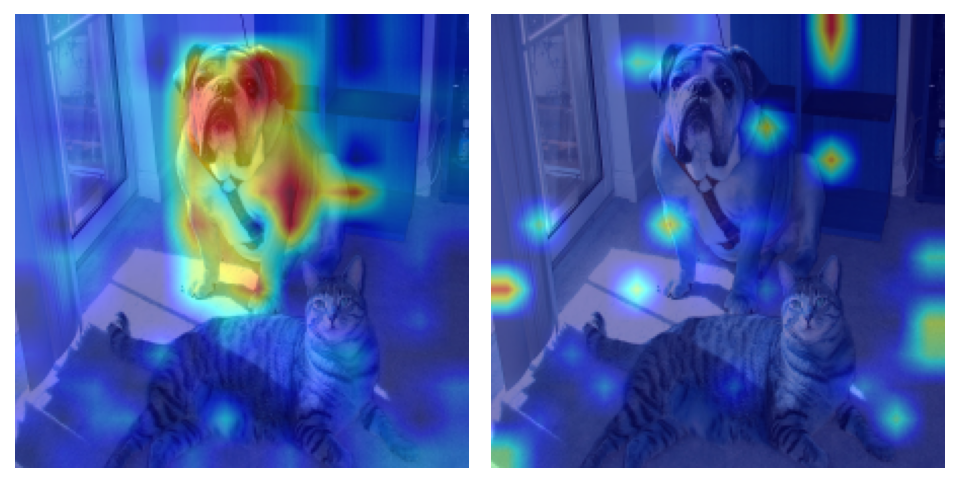

our_top3_prob_target1: tensor([[0.1637, 0.0438, 0.0357]])
our_top3_indices_target1: tensor([[981, 727, 809]])
our_the_rank_target1: 462
our_the_probability_target1: 0.1637345403432846
our_top3_prob_target2: tensor([[0.1637, 0.0438, 0.0357]])
our_top3_indices_target2: tensor([[981, 727, 809]])
our_the_rank_target2: 807
our_the_probability_target2: 0.0006311748875305057


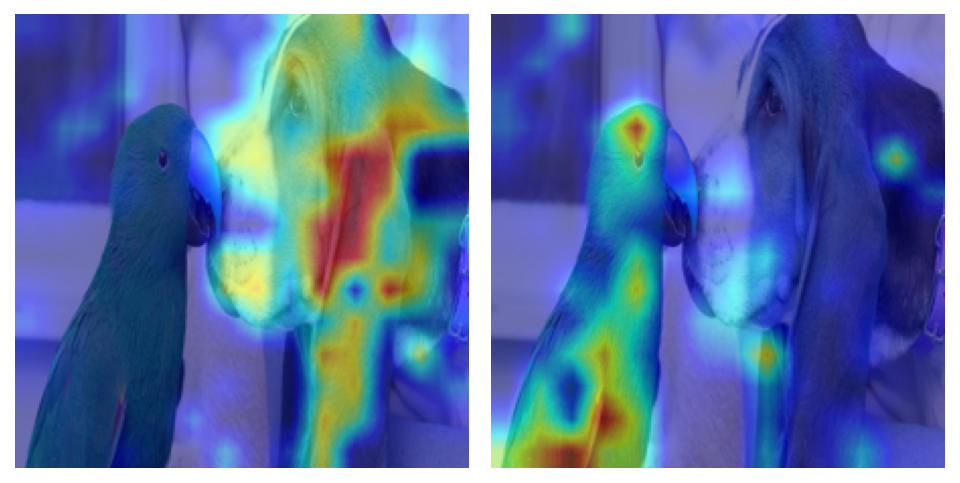

our_top3_prob_target1: tensor([[0.0919, 0.0837, 0.0094]])
our_top3_indices_target1: tensor([[851, 581, 860]])
our_the_rank_target1: 817
our_the_probability_target1: 0.000443869037553668
our_top3_prob_target2: tensor([[0.0919, 0.0837, 0.0094]])
our_top3_indices_target2: tensor([[851, 581, 860]])
our_the_rank_target2: 73
our_the_probability_target2: 0.001330172293819487


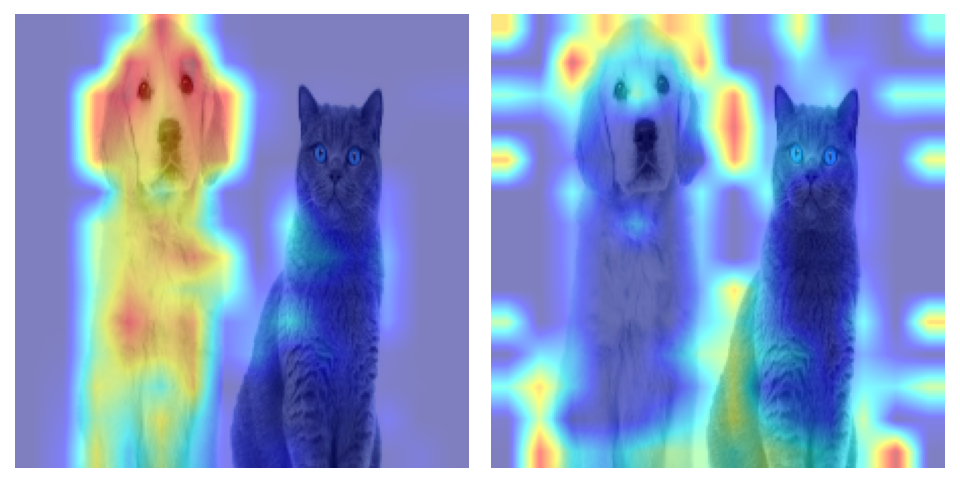

our_top3_prob_target1: tensor([[0.1450, 0.0498, 0.0151]])
our_top3_indices_target1: tensor([[203, 522,   2]])
our_the_rank_target1: 163
our_the_probability_target1: 0.0017166148172691464
our_top3_prob_target2: tensor([[0.1450, 0.0498, 0.0151]])
our_top3_indices_target2: tensor([[203, 522,   2]])
our_the_rank_target2: 656
our_the_probability_target2: 0.0008503096178174019


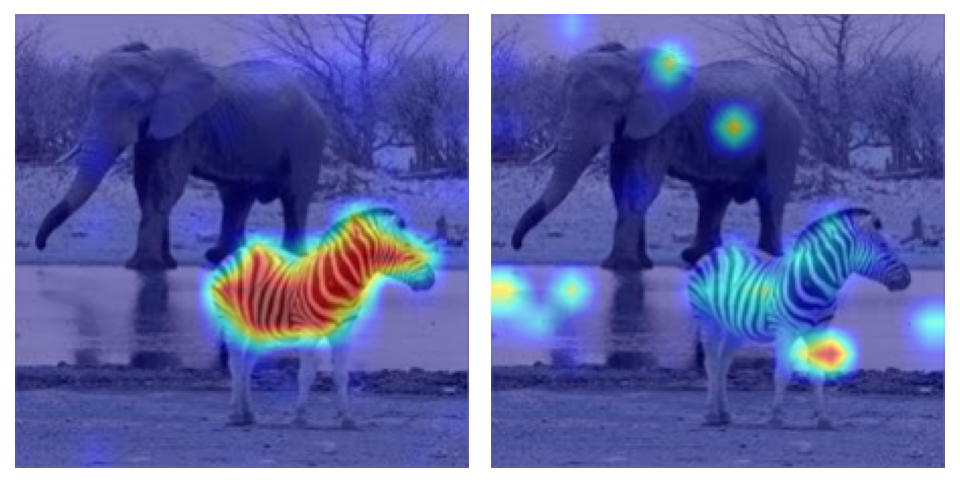

In [22]:
# Loop all images in vis 
import os 
save_dir = "/home/hengl/lbsm/vis/results/cam"
vis_dir = "/home/hengl/lbsm/vis/images_for_cam"
file_paths = ["/home/hengl/lbsm/vis/images_for_cam/catdog.jpg", # dog 499 cat 55
              "/home/hengl/lbsm/vis/images_for_cam/dogbird.png", # bird 408 dog 161
              "/home/hengl/lbsm/vis/images_for_cam/dogcat2.png", # 
              "/home/hengl/lbsm/vis/images_for_cam/el2.png",] # zebra 80 tusker 214
class_list = [[499, 5], [161, 408], [100, 8], [80, 214]]
for image_path, target_list in zip(file_paths, class_list):
    cam_ours_target1, our_top3_prob_target1, our_top3_indices_target1, our_the_rank_target1, our_the_probability_target1 = generate_cam_image(our_model, method='gradcam', image_path=image_path, target = None, fake_target=converter.batch_convert(target_list[0], reverse=True), use_cuda=True, aug_smooth=True, eigen_smooth=False)
    print(f"our_top3_prob_target1: {our_top3_prob_target1}")
    print(f"our_top3_indices_target1: {our_top3_indices_target1}")
    print(f"our_the_rank_target1: {our_the_rank_target1}")
    print(f"our_the_probability_target1: {our_the_probability_target1}")
    #cv2.imwrite(os.path.join(save_dir, f"cam_pretrain.jpg"), cam_pretrain)
    cam_ours_target2, our_top3_prob_target2, our_top3_indices_target2, our_the_rank_target2, our_the_probability_target2 = generate_cam_image(our_model, method='gradcam', image_path=image_path, target=converter.batch_convert(target_list[1]), use_cuda=True, aug_smooth=True, eigen_smooth=False)
    print(f"our_top3_prob_target2: {our_top3_prob_target2}")
    print(f"our_top3_indices_target2: {our_top3_indices_target2}")
    print(f"our_the_rank_target2: {our_the_rank_target2}")
    print(f"our_the_probability_target2: {our_the_probability_target2}")
    show_cam_comparison(cam_ours_target1, cam_ours_target2, image_path)

In [20]:
converter.batch_convert(408)

446

/home/hengl/lbsm/vis/images_for_cam/catdog.jpg


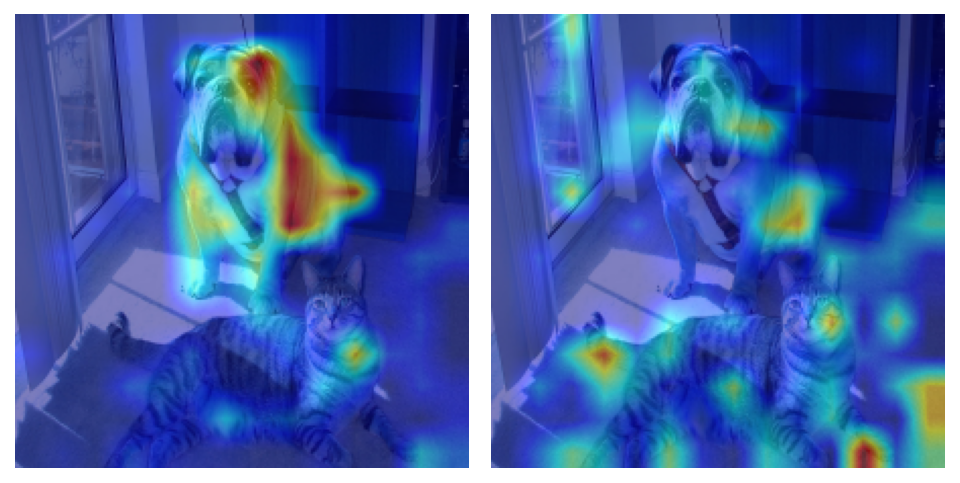

/home/hengl/lbsm/vis/images_for_cam/dogbird.png


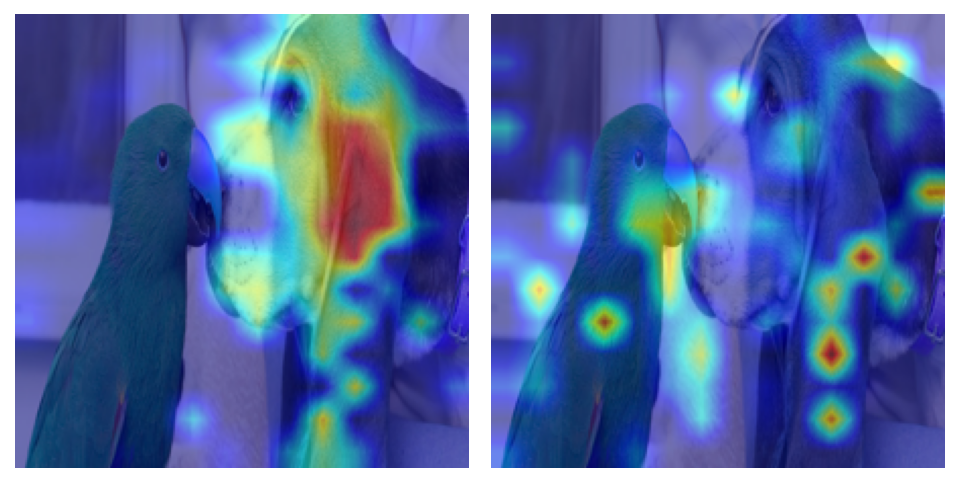

/home/hengl/lbsm/vis/images_for_cam/dogcat2.png


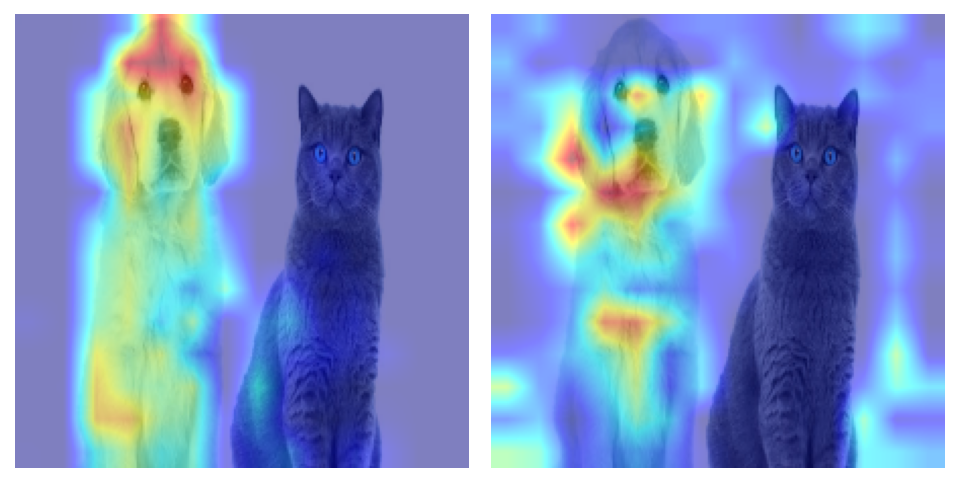

/home/hengl/lbsm/vis/images_for_cam/el2.png


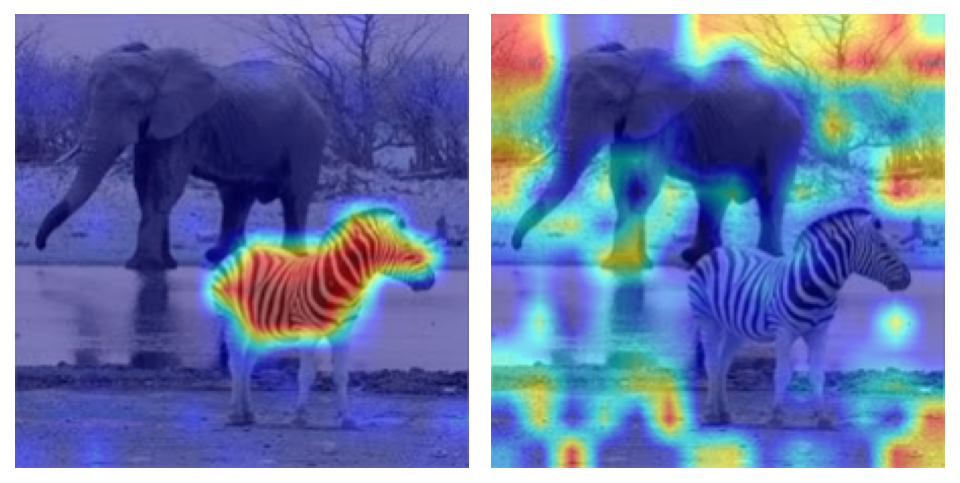

In [304]:
# Loop all images in vis 
import os 
save_dir = "/home/hengl/lbsm/vis/results/cam"
vis_dir = "/home/hengl/lbsm/vis/images_for_cam"
file_paths = ["/home/hengl/lbsm/vis/images_for_cam/catdog.jpg", # dog 499 cat 55
              "/home/hengl/lbsm/vis/images_for_cam/dogbird.png", # dog 161 bird 408 
              "/home/hengl/lbsm/vis/images_for_cam/dogcat2.png", # dog cat 8
              "/home/hengl/lbsm/vis/images_for_cam/el2.png",] # zebra 80 tusker 214
class_list = [[499, 5], [161, 408], [100, 8], [80, 214]]
for image_path, target_list in zip(file_paths, class_list):
    print(image_path)
    cam_pretrain_target1 = generate_cam_image(pretrained_model, method='gradcam', image_path=image_path, target=None, use_cuda=True, aug_smooth=False, eigen_smooth=False)
    #cv2.imwrite(os.path.join(save_dir, f"cam_pretrain.jpg"), cam_pretrain)
    cam_pretrain_target2 = generate_cam_image(pretrained_model, method='gradcam', image_path=image_path, target=target_list[1], use_cuda=True, aug_smooth=False, eigen_smooth=False)
    #cv2.imwrite(os.path.join(save_dir, f"cam_ours.jpg"), cam_ours)
    show_cam_comparison(cam_pretrain_target1, cam_pretrain_target2, image_path)

- /datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n09399592/ILSVRC2012_val_00042143.JPEG 关注水面
- /datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n09332890/ILSVRC2012_val_00015143.JPEG 关注水面
- /datadrive/mount/hengl/imagenet1k/ILSVRC/Data/CLS-LOC/val/n09246464/ILSVRC2012_val_00042182.JPEG 关注悬崖 而不是水面